### ΟΡΑΣΗ ΥΠΟΛΟΓΙΣΤΩΝ Ακαδ.΄Ετος 2020–2021
$2^{o}$ Εργαστηριακό Project

Παυλάκη Παρασκευή-Ευγενία  $ $ ΑΜ: $ $ 03117190

Τσακανίκα Χριστίνα  $ $ ΑΜ: $ $ 03117012

#### Μέρος 1: Παρακολούθηση Προσώπου και Χεριών με Χρήση της Μεθόδου Οπτικής Ροής των Lucas-Kanade

In [1]:
# Imports
import cv2
import numpy as np
import os
import matplotlib.pyplot as plt
import math
import scipy.io
from scipy.stats import multivariate_normal
from scipy.ndimage import map_coordinates, label
import scipy.stats

%matplotlib inline

####  1.1 Ανίχνευση Δέρματος Προσώπου και Χεριών


In [2]:
#load mat file 
mat_file = scipy.io.loadmat("skinSamplesRGB.mat")

#read rgb and convert it to ycrcb 
skin_sam_rgb = mat_file['skinSamplesRGB'] # array that contains R, G, B arrays. Each one of the three arrays has 22 lines and 81 columns.

skin_sam_ycbcr = cv2.cvtColor(skin_sam_rgb, cv2.COLOR_RGB2YCrCb)
Cr = skin_sam_ycbcr[:,:,1]
Cb = skin_sam_ycbcr[:,:,2]

# make them flat 
Cb = Cb.reshape(1,-1)
Cr = Cr.reshape(1,-1)

#define  mean nad covariance
mean = np.array([np.mean(Cr),np.mean(Cb)])
cov = np.cov(Cr,Cb)

In [5]:
def fd(I, mu, cov):
        
    Ι = cv2.cvtColor(I, cv2.COLOR_RGB2YCrCb)
    threshold = 0.25
    
    Cr, Cb = Ι[:,:,1], Ι[:,:,2]
    Cr_flat = Cr.reshape(1,-1) 
    Cb_flat = Cb.reshape(1,-1)
    
    c = np.dstack((Cr, Cb))
    
    P = scipy.stats.multivariate_normal(mean,cov) 
    
    # create the skin image
    skin = (((P.pdf(c)/np.max(P.pdf(c)))>=threshold))
    skin = skin.astype(int)
    
    #find the skin area
    coordy, coordx = np.where(skin==1)
    img_skin = np.zeros((I.shape[0],I.shape[1]))
    coords = np.stack((coordy,coordx),axis=-1)
    for coord in coords:
        i = coord[0]
        j = coord[1]
        img_skin[i,j] = 1
     
    thresholded_image = img_skin
    # small opening kernel
    kern_open = np.ones((3,3),dtype=np.uint8)
    
    # much bigger closing kernel
    kern_close = np.ones((18,18),dtype=np.uint8) 
    
    # Do the openig and then put the output in the closing
    opened_image = cv2.morphologyEx(img_skin, cv2.MORPH_OPEN, kern_open)
    closed_image = cv2.morphologyEx(opened_image, cv2.MORPH_CLOSE, kern_close, iterations=5)  
    
    # Clustering with given function #
    labels, features = label(closed_image)
    
    # Find the boundaries for the 3 clusters
    boundings = []
    for i in range(1,features+1):

        x,y = np.where(labels == i)
        x = np.sort(x) 
        y = np.sort(y) 
        width = x[-1]-x[0]
        height = y[-1] - y[0]
        
        #define a little bit greater area for the head and hands respectively
        if i == 1:
            boundings.append([y[0]-5, x[0]-3,height+8,width+5])
            
        if i == 2:
            boundings.append([y[0]-5, x[0]-20,height+8,width+27])
            
        if i == 3:
            boundings.append([y[0]-10, x[0]-15,height+8,width+25])
    
    #show us the output
    c = """    
    f, axarr = plt.subplots(2,2, figsize=(9, 9))
    axarr[0,0].imshow(I)
    axarr[0,0].title.set_text('First Plot')
    axarr[0,1].imshow(thresholded_image)
    axarr[0,1].title.set_text('Thresholded Image')
    axarr[1,0].imshow(opened_image)
    axarr[1,0].title.set_text('Opened Image')
    axarr[1,1].imshow(closed_image)
    axarr[1,1].title.set_text('Closed Image')
    """  
    return boundings

[[134, 88, 77, 126], [58, 239, 47, 64], [159, 256, 75, 62]]


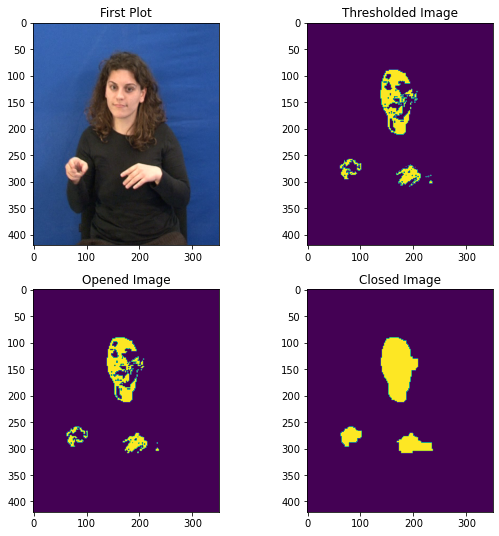

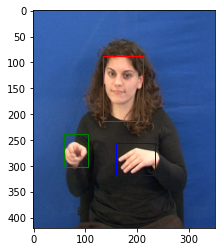

In [4]:

img = cv2.cvtColor(cv2.imread("1.png"), cv2.COLOR_BGR2RGB)
larray = fd(img, mean, cov)

import matplotlib.pyplot as plt
import matplotlib.patches as patches
from PIL import Image

im = Image.open('1.png')

# Create figure and axes
fig, ax = plt.subplots()
colors = ["r","g","b"]
# Display the image
ax.imshow(im)
#print the array with the coordinates of the head and hands
print(larray) 
for i in range(len(larray)):
    # Create a Rectangle patch
    rect = patches.Rectangle((larray[i][0], larray[i][1]), larray[i][2], larray[i][3], linewidth=1, edgecolor=colors[i], facecolor='none')
    # Add the patch to the Axes
    ax.add_patch(rect)


plt.show()

#### 1.2.1 Υλοποίηση του Αλγόριθμου των Lucas-Kanade

In [33]:
def lk(I1, I2, features, rho, epsilon, dx0, dy0):
    
    # Image values [0,1]
    I1 = (I1 - I1.min())/I1.max()
    I2 = (I2 - I2.min())/I2.max()
    
    sigma = rho
    
    # Guassian kernel 
    n = int(2*np.ceil(3*sigma)+1)
    gauss1D = cv2.getGaussianKernel(n, sigma) # Column vector
    gauss2D = gauss1D @ gauss1D.T # Symmetric gaussian kernel
    gauss = gauss2D
    
    # Compute the gradient of the image and pay attention to y,x axis
    Iy, Ix = np.gradient(I1)
    
    # here we will store optical flow vector for each seature
    d = []
    
    for feature in features:
        
        # the array of the features
        f = (feature[1], feature[0])
        
        # Define Control Input #
        u = np.zeros(2)
        
        # Define a small 2-pixel area around each feature
        yup, ydown, fy = f[0]-2, f[0]+2, 2
        xleft, xright, fx = f[0]-2, f[0]+2, 2
        
        I1cut = I1[yup:ydown, xleft:xright]
        I2cut = I2[yup:ydown, xleft:xright]
        
        # Take the small area for each pixel
        gycut = Iy[yup:ydown, xleft:xright]
        gxcut = Ix[yup:ydown, xleft:xright]
        
        # store the area around the feature in y and x axis
        farea = (fy, fx)
        
        # Define Dimensions #
        dimy = I1_crop.shape[0]
        dimx = I1_crop.shape[1]

        # Define Functions Domain #
        x = np.linspace(0, dimx-1, dimx)
        y = np.linspace(0, dimy-1, dimy)

        # Define Coordinates of Functions #
        xx, yy = np.meshgrid(x, y)

        # Initialize Optical Flow Vectors: di-1, di #
        prevd = np.zeros(2)
        currd = np.array([dy0, dx0], dtype='float')   
        
        
        # pseudovalue of the norm
        norm = 10**5

        # Initialize iterations #
        iterations = 0

        while(norm > 0.005):


            # Define Coordinates of Optical Flow #
            dx, dy = current_d

            # Define A matrix with Shifted Gradients #
            A1 = map_coordinates(gxcut, [np.ravel(yy+dy), np.ravel(xx+dx)], order=1).reshape(dimy, dimx)
            A2 = map_coordinates(gycut, [np.ravel(yy+dy), np.ravel(xx+dx)], order=1).reshape(dimy, dimx)

            # Define matrices for Computing Control Input 'u' #
            A11 = cv2.filter2D(A1**2, -1, gauss) + epsilon
            A22 = cv2.filter2D(A2**2, -1, gauss) + epsilon
            A12 = cv2.filter2D(A1*A2, -1, gauss)
            A21 = A12

            
            I1n = map_coordinates(I1cut, [np.ravel(yy+dy), np.ravel(xx+dx)], order=1).reshape(dimy, dimx)

            # E
            E = I2_crop - I1n

            # Convolve Error with Gaussian #
            B1 = cv2.filter2D(A1*E, -1, gauss)
            B2 = cv2.filter2D(A2*E, -1, gauss)

            # Find the Values of Functions Gas #
            a11 = map_coordinates(A11, [[farea[0]], [farea[1]]], order=1)[0]
            a22 = map_coordinates(A22, [[farea[0]], [farea[1]]], order=1)[0]
            a12 = map_coordinates(A12, [[farea[0]], [farea[1]]], order=1)[0]
            a21 = a12

            # Find the Values of Functions Ges #
            b1 = map_coordinates(B1, [[farea[0]], [farea[1]]], order=1)[0]
            b2 = map_coordinates(B2, [[farea[0]], [farea[1]]], order=1)[0]

            # Define Ga-matrix and Ge vector #
            A = np.array([[a11, a12],
                           [a21, a22]])

            B = np.array([[b1],
                          [b2]])

            # least square u array    
            u = np.ravel(np.linalg.inv(A)@B)
                
            
            prevd = np.copy(current_d)
            currd += u
            
            # compute the new norm and tell if we have to stop or not
            norm = np.linalg.norm(currd-prevd)

            # if the norm never be under 0.005 stop after completing 500 iterations.
            iterations += 1
            if iterations == 500:
                break
         
        d.append(currd[:])
    
   
    d = np.array(d)
    
    #return the optical flow vector
    d = -d
    return d

#### 1.2.2 Υπολογισμός της Μετατόπισης των Παραθύρων από τα Διανύσματα Οπτικής Ροής

In [34]:
def displ(dxs, dys, thres = 0.1):    
    
    finalvect = [] #here we will store the features with the accepted energy

    for dx, dy in zip(dxs, dys):
        
        # compute
        E = dx**2 + dy**2
        
        if E <= thres:
            continue
        
        # Add new vector #
        finalvect.append(np.array([dx, dy]))
    
    
    finalvect = np.array(finalvect)
    
    # store in the initial vectors the new ones with the correct features
    dxs = finalvect[:, 0]
    dys = finalvect[:, 1]
    
    # compute the mean value in x and y axis
    mx = np.mean(dxs)
    my = np.mean(dys)
    
    # mean value and covariance
    m = np.array([mx, my])
    Cov = np.cov(dxs, dys)

    # for grater accuracy we gonna compute the weighted average
    p = scipy.stats.multivariate_normal(m,Cov) 
    
    weights = (p.pdf(list(zip(dxs, dys)))-p.pdf(list(zip(dxs, dys))).min())/p.pdf(list(zip(dxs, dys))).max()
    
    
    return np.average(np.stack((dxs, dys), axis=1), weights=weights, axis=0)


In [9]:
def run_lk(mean, cov):
    #runs lucas kanade algorith for frames 1-2, 2-3, 3-4...
    
    rho = 5
    epsilon = 0.01
    dx0, dy0 = 0,0
    
    # red for the face, green for right hand, blue for the left hand
    colors = [(255,0,0),(0,255,0),(0,0,255)] 

    # some extra pixels for the boundings
    extra = 20

    for i in range(1,67):   
            
        img1 = cv2.imread(str(i)+'.png')
        img2 = cv2.imread(str(i+1)+'.png')
        
        if i == 1:
            img1 = cv2.cvtColor(img1, cv2.COLOR_BGR2RGB)
            # compute the boundings just for the first image
            skin = fd(img1, mean, cov)

        
        first = cv2.cvtColor(img1, cv2.COLOR_BGR2GRAY)
        second = cv2.cvtColor(img2, cv2.COLOR_BGR2GRAY)

        # BGR2RGB Transformation #
        img2 = cv2.cvtColor(img2, cv2.COLOR_BGR2RGB)

        # Define gaussian kernel #
        # Guassian kernel 
        sigma = 0.1
        n = int(2*np.ceil(3*sigma)+1)
        gauss1D = cv2.getGaussianKernel(n, sigma) # Column vector
        gauss2D = gauss1D @ gauss1D.T # Symmetric gaussian kernel
        gauss = gauss2D

        
        #counter for the colors
        j = 0

        for char in skin:

            # Find boundaries #
            x = char[0]
            y = char[1]
            width = char[2]
            height = char[3]

            # Cut images
            firstcrop = first[y-extra:y+height+extra, x-extra:x+width+extra]
            secondcrop = second[y-extra:y+height+extra, x-extra:x+width+extra]

            # Extract Features #
            features = cv2.goodFeaturesToTrack(secondcrop, 20, 0.05, 5)
            features = np.squeeze(features.astype(int))

            
            d = lk(firstcrop, secondcrop, features, rho, epsilon, dx0, dy0)

            # find the mean with the displ function
            meandx, meandy = displ(d[:, 0], d[:, 1])

            # move the boxes
            newleft = int(np.round(x+meandx))
            upper = int(np.round(y+meandy))

            
            newright = int(np.round((x+meandx) + width ))
            lower = int(np.round((y+meandy) + height))
            
            # show the new rectangle
            img2 = cv2.rectangle(img2, (newleft, upper), (newright, lower), colors[j], 2) 
            
            # Update Coordinates #
            char[0] = new_left
            char[1] = new_top
                        
            j += 1

        
        plt.figure(figsize=(5,5))
        plt.title(f"Frame {i+1}")
        plt.imshow(img2) 
        plt.show()


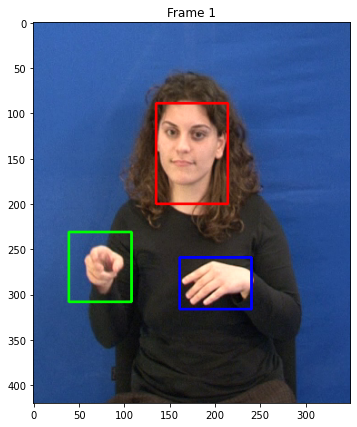

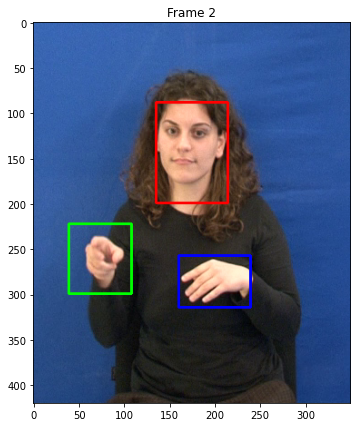

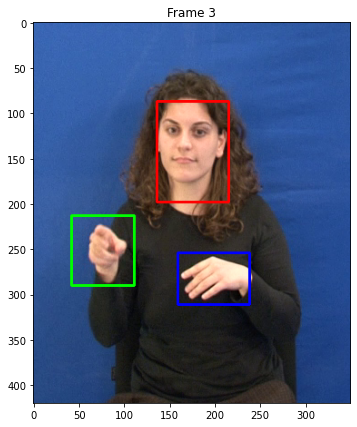

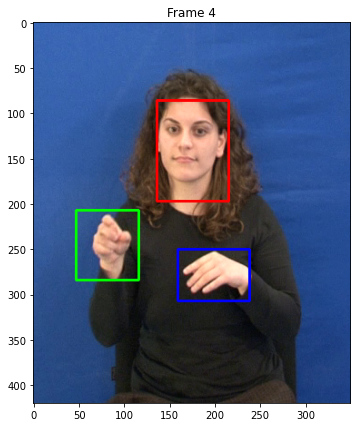

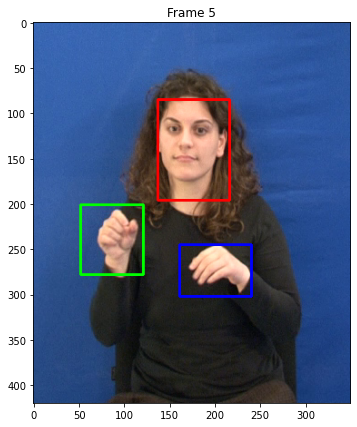

...

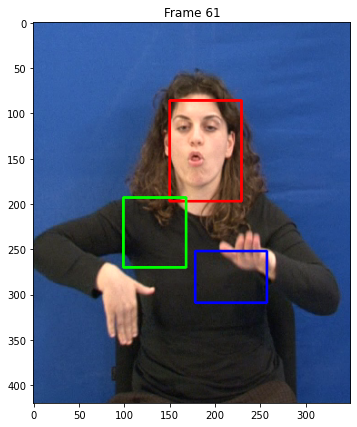

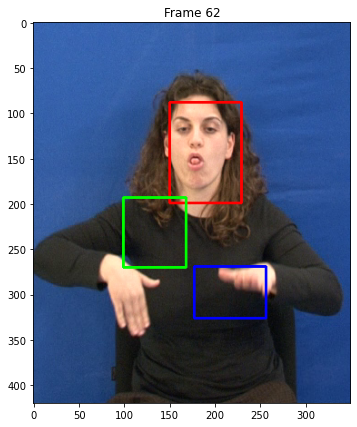

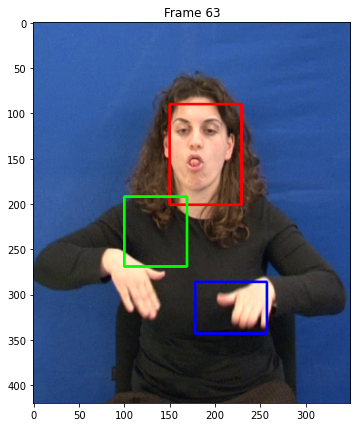

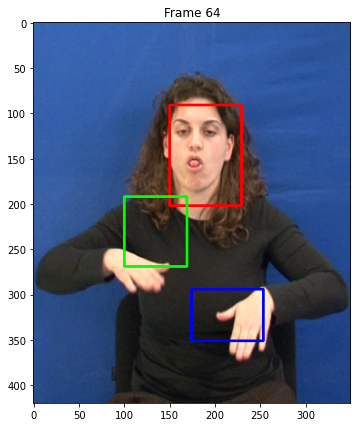

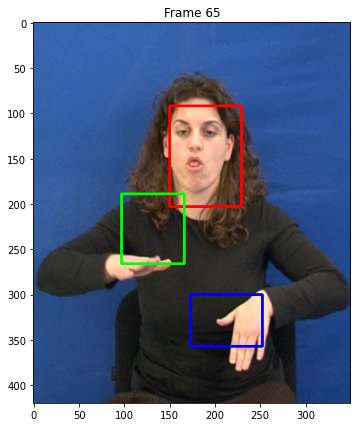

In [27]:
run_lk(mean, cov)

#### 1.2.3 Πολυ-Κλιμακωτός Υπολογισμός Οπτικής Ροής

In [28]:
def lk(I1, I2, features, rho, epsilon, dx0, dy0):
    
    I1 = (I1- I1.min())/I1.max()
    I2 = (I2-I2.min())/I2.max()
    
    n = int(2*np.ceil(3*rho)+1) 

    gauss1D = cv2.getGaussianKernel(n, rho) # Column vector
    gauss2D = gauss1D @ gauss1D.T # Symmetric gaussian kernel

    x_0, y_0 = np.meshgrid(np.arange(0,I1.shape[1]),np.arange(0, I1.shape[0]))

    I1yy, I1xx = np.gradient(I1)
    
    dy_i = dx0
    dx_i = dy0
    dx = np.zeros(dx_i.shape)
    dy = np.zeros(dy_i.shape)
    
    for times in range(100):

        In = map_coordinates(I1,[np.ravel(y_0+dy_i), np.ravel(x_0+dx_i)], order=1).reshape(I1.shape)
        A1 = map_coordinates(I1xx,[np.ravel(y_0+dy_i), np.ravel(x_0+dx_i)], order=1).reshape(I1xx.shape)
        A2 = map_coordinates(I1yy,[np.ravel(y_0+dy_i), np.ravel(x_0+dx_i)], order=1).reshape(I1yy.shape)

        E = I2 - In

        a11 = cv2.filter2D(A1**2,-1,gauss2D) + epsilon
        a12 = cv2.filter2D(A1*A2,-1,gauss2D)
        a21 = a12
        a22 = cv2.filter2D(A2**2,-1,gauss2D) + epsilon

        b1 = cv2.filter2D(A1*E,-1,gauss2D)
        b2 = cv2.filter2D(A2*E,-1,gauss2D)

        u1 = (a22*b1 - a12*b2) / (a11*a22 - a12*a21)
        u2 = (a11*b2 - a21*b1) / (a11*a22 - a12*a21)

        dy_i += u1

        dx_i += u2
        
    for i in range(features.shape[0]):
        
        x,y = int(features[i,0,0]), int(features[i,0,1])
        dx[y][x] = dx_i[y][x]
        dy[y][x] = dy_i[y][x]
            
    return np.array(dx), np.array(dy)

In [29]:
def displ(d_x,d_y):
    x = 0
    y = 0
    N = 0
    for i in range(len(d_x)):
        if d_x[i]**2+d_y[i]**2 > 0.1: 
            x += d_x[i]
            y += d_y[i]
            N += 1
    return [x/N, y/N]

def Μultiscale_lk(I1, I2, levels):
    
    epsilon = 0.01
    
    feature_params = dict( maxCorners = 100,
                       qualityLevel = 0.1,
                       minDistance = 7,
                       blockSize = 7)
    
    # Gaussian kernel
    rho = 3 #standard deviation
    n = int(2*np.ceil(3*rho)+1) 
    gauss1D = cv2.getGaussianKernel(n, rho) # Column vector
    gauss2D = gauss1D @ gauss1D.T # Symmetric gaussian kernel
    
    #construct gaussian pyramid for each image
    pyramid1 = [I1]
    pyramid2 = [I2]
    
    for n in range(levels-1):
        convolve1 = cv2.filter2D(I1, -1, gauss2D)
        I1_out = convolve1[::2, ::2]
        I1 = I1_out
        
        convolve2 = cv2.filter2D(I2, -1, gauss2D)
        I2_out = convolve2[::2, ::2]
        I2 = I2_out
        
        pyramid1.append(I1_out)
        pyramid2.append(I2_out)
    
    features = cv2.goodFeaturesToTrack(pyramid2[levels-1], mask = None, **feature_params)
    
    
    dx0 = np.zeros(I1.shape)
    dy0 = np.zeros(I1.shape)
    
    for i in range(levels-1,0,-1):
        
        features = cv2.goodFeaturesToTrack(pyramid2[i], mask = None, **feature_params)
        dx0, dy0 = lk(pyramid1[i], pyramid2[i],features,rho, epsilon, dx0, dy0 )
        
        outputx, outputy = np.zeros((pyramid1[i-1].shape[0],pyramid1[i-1].shape[1])),  np.zeros((pyramid1[i-1].shape[0],pyramid1[i-1].shape[1]))
        outputx[::2, ::2] = dx0
        outputy[::2, ::2] = dy0
        
        dx0 = outputx
        dy0 = outputy

    return dx0,dy0

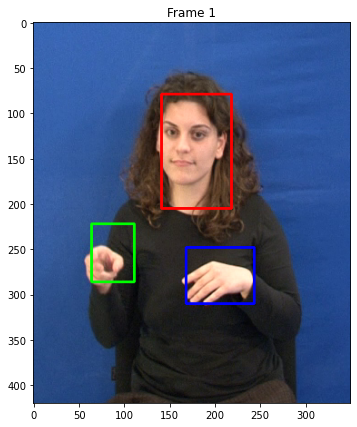

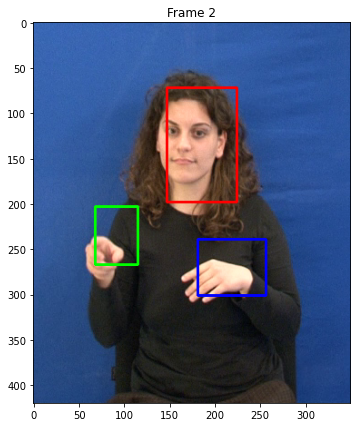

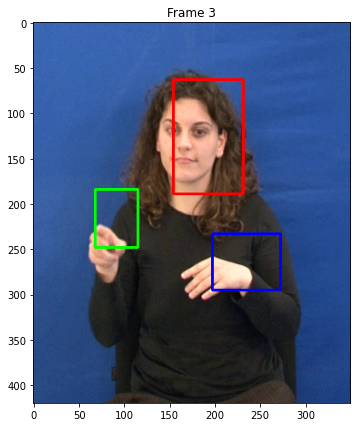

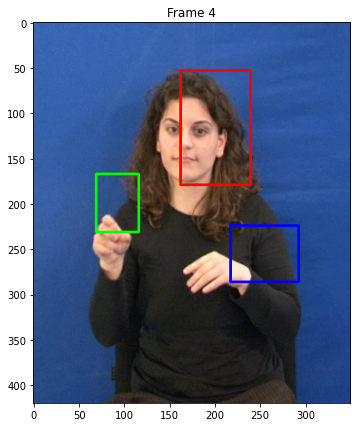

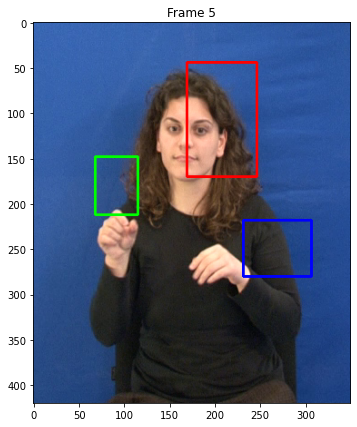

In [30]:
#for the first five frames show the multiscale lucas kanade, just like run_lk
for i in range(1,6):   
          
    img1 = cv2.imread(str(i)+'.png')
    img2 = cv2.imread(str(i+1)+'.png')
        
    if i == 1:
        img1 = cv2.cvtColor(img1, cv2.COLOR_BGR2RGB)
        skin = fd(img1, mean, cov)

    frame1 = cv2.cvtColor(img1, cv2.COLOR_BGR2GRAY)
    frame2 = cv2.cvtColor(img2, cv2.COLOR_BGR2GRAY)

    img2 = cv2.cvtColor(img2, cv2.COLOR_BGR2RGB)

    sigma = 0.1
    n = int(2*np.ceil(3*sigma)+1)
    gauss1D = cv2.getGaussianKernel(n, sigma) # Column vector
    gauss2D = gauss1D @ gauss1D.T # Symmetric gaussian kernel
    gauss = gauss2D
    
    offset = 20
    j = 0
    colors = [(255,0,0),(0,255,0),(0,0,255)]
    for char in skin:

        x = char[0]
        y = char[1]
        width = char[2]
        height = char[3]
        
           
        frame1_cut = frame1[y-offset:y+height+offset, x-offset:x+width+offset]
        frame2_cut = frame2[y-offset:y+height+offset, x-offset:x+width+offset]

            
        features = cv2.goodFeaturesToTrack(frame2_cut, 20, 0.05, 5)
        features = np.squeeze(features.astype(int))

            
        (dx0,dy0) = Μultiscale_lk(frame1_cut, frame2_cut, 3)
        dx0 = dx0.flatten()
        dy0 = dy0.flatten()
            
        dflx, dfly = displ(dx0,dy0)
            
        new_left = int(np.round(x+dflx))
        new_top = int(np.round(y+dfly))

            
        new_right = int(np.round((x+dflx) + width ))
        new_bottom = int(np.round((y+dfly) + height))
            
            
        img2 = cv2.rectangle(img2, (new_left, new_top), (new_right, new_bottom), colors[j], 2) 
            
            # Update 
        char[0] = new_left
        char[1] = new_top
                        
        j += 1

        
    plt.figure(figsize=(5,5))
    plt.title(f"Frame {i}")
    plt.imshow(img2) 
    plt.savefig(f"./multiscale/Frame{i}")
    plt.show()

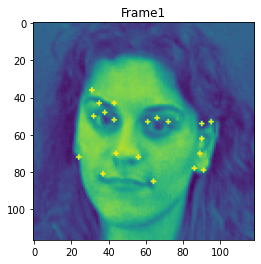

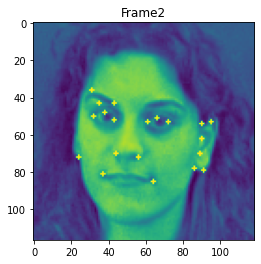

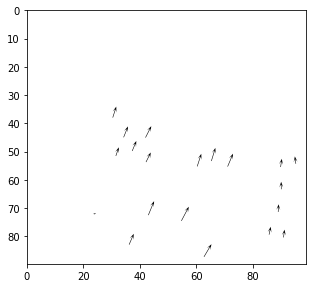

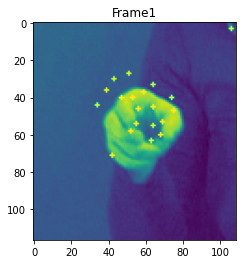

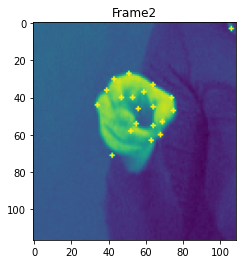

...

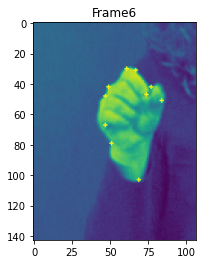

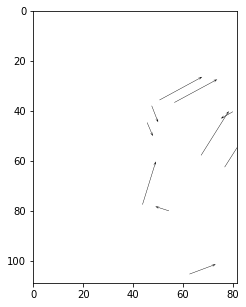

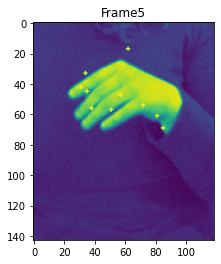

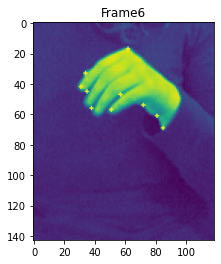

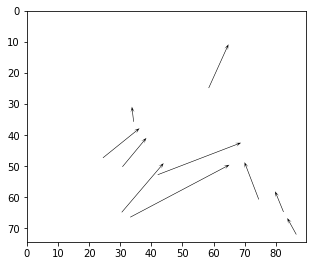

In [39]:
#Show the optical flow vector for the first 5 frames
# Load Image #
for j in range(1,6):
    img1 = cv2.imread(str(j)+'.png')
    img2 = cv2.imread(str(j+1)+'.png')

    [head, l_hand, r_hand] = BoundingBox(img1, mean, cov)
    
    for c in [head, l_hand, r_hand]:

        x = c[0]
        y = c[1]
        width = c[2]
        height = l_hand[3]


        # Define Offset #
        offset = 20
        
        img1plot = cv2.cvtColor(img1, cv2.COLOR_BGR2RGB)
        img2plot = cv2.cvtColor(img2, cv2.COLOR_BGR2RGB)
        img1 = cv2.cvtColor(img1, cv2.COLOR_BGR2GRAY)
        img2 = cv2.cvtColor(img2, cv2.COLOR_BGR2GRAY)

        img1 = img1[y-offset:y+height+offset, x-offset:x+width+offset]
        img2 = img2[y-offset:y+height+offset, x-offset:x+width+offset]

        sigma = 0.1
        n = int(2*np.ceil(3*sigma)+1)
        gauss1D = cv2.getGaussianKernel(n, sigma) # Column vector
        gauss2D = gauss1D @ gauss1D.T # Symmetric gaussian kernel
        gauss = gauss2D

        img1 = cv2.filter2D(img1, -1, gauss)
        img2 = cv2.filter2D(img2, -1, gauss)

        # Define Parameters #
        rho = 4
        epsilon = 0.01
        dx0, dy0 = 0,0

        # Extract Features #
        features = cv2.goodFeaturesToTrack(img2, 20, 0.1,5)
        features = np.squeeze(features.astype(int))

        # Plot the features on the images #
        img_draw = np.copy(img1)
        for i in features:
            x,y = i.ravel()
            cv2.circle(img_draw,(x,y),1,255,-1)
        plt.imshow(img_draw)
        plt.title('Frame'+str(j))
        plt.show()

        img_draw = np.copy(img2) 
        for i in features:
            x,y = i.ravel()
            cv2.circle(img_draw,(x,y),1,255,-1)
        plt.imshow(img_draw)
        plt.title('Frame'+str(j+1))
        plt.show()


        # Call lk-function #
        d = lk(img1, img2, features, rho, epsilon, dx0, dy0)


        # Shift the features to match with image1 #
        feat1 = features - d

        # Plot the Optical Flow #
        head_params = dict(headwidth=7, 
                           headaxislength=5, 
                           headlength=10,
                           width=0.002) 

        fig, ax = plt.subplots(figsize=(5,5), )
        ax.quiver(feat1[:,0], feat1[:,1], d[:,0], d[:,1], angles='xy', scale=50, **head_params)
        ax.set_xlim(0,ax.get_xlim()[1])
        ax.set_ylim(ax.get_ylim()[1],0)
        ax.set_aspect("equal")
        plt.show()
        img1 = cv2.imread(str(j)+'.png')
        img2 = cv2.imread(str(j+1)+'.png')

#### Μέρος 2: Εντοπισμός Χωρο-χρονικών Σημείων Ενδιαφέροντος και Εξαγωγή Χαρακτηριστικών σε Βίντεο Ανθρωπίνων Δράσεων

In [41]:
import math 
from cv21_lab2_2_utils import read_video
from cv21_lab2_2_utils import show_detection 
from cv21_lab1_part2_utils import disk_strel
from cv21_lab2_2_utils import orientation_histogram
import cv2
import numpy as np
import scipy
from cv21_lab2_2_utils import bag_of_words
from cv21_lab2_2_utils import svm_train_test

#### 2.1.1

In [43]:
def Harris_Stephens(V, rho, tau, theta_corn, k):
    #rho = 2
    #tau = 3
    #k = 0.001
    #theta_corn = 0.003

    #normalize
    V = V/255.0

    #our video is a 3D vector where the third dimension is time
    Lx, Ly, Lt = np.gradient(V)

    n = int(2*np.ceil(3*rho)+1)
    t = int(2*np.ceil(3*tau)+1)

    gauss1D = cv2.getGaussianKernel(n, rho) # Column vector
    gauss2D = gauss1D @ gauss1D.T # Symmetric gaussian kernel

    gausst = cv2.getGaussianKernel(t, tau)

    Lx2 = cv2.filter2D(cv2.filter2D(Lx**2, -1, gauss2D), -1, gausst)
    LxLy = cv2.filter2D(cv2.filter2D(Lx*Ly, -1, gauss2D), -1, gausst)
    Ly2 = cv2.filter2D(cv2.filter2D(Ly**2, -1, gauss2D), -1, gausst)
    LyLt = cv2.filter2D(cv2.filter2D(Ly*Lt, -1, gauss2D), -1, gausst)
    Lt2 = cv2.filter2D(cv2.filter2D(Lt**2, -1, gauss2D), -1, gausst)
    LxLt = cv2.filter2D(cv2.filter2D(Lx*Lt, -1, gauss2D), -1, gausst)

    trace = Lx2 + Ly2 + Lt2
    determinant = Lx2*Ly2*Lt2 + 2*LxLy*LxLt*LyLt - Lx2*LyLt**2 - Ly2*LxLt**2 - Lt2*LxLy**2

    H = abs(determinant - k*trace**3)
    #Hmax1 = max(map(max, H.any()))
    
    Hmax = H.max()
    #print(H.shape, Hmax)
    
    B_sq = disk_strel(n)

    cond1 = (H == cv2.dilate(H, B_sq))
    cond2 = (H > theta_corn*Hmax)
    cond = cond1&cond2

    HarrisStephens = np.where(cond == True)
    coords = list(zip(HarrisStephens[0], HarrisStephens[1], HarrisStephens[2]))
    features = []

    for coord in coords:
        features.append([coord[1], coord[0],coord[2], tau])
    return np.array(features)


#### 2.1.2

In [203]:
from numpy import unravel_index

def Gabor(V,tau,rho):
    
    #rho = 2
    #tau = 3
    #k = 0.001
    #theta_corn = 0.003

    n = int(2*np.ceil(3*rho)+1)
    gauss1D = cv2.getGaussianKernel(n, rho) # Column vector
    gauss2D = gauss1D @ gauss1D.T # Symmetric gaussian kernel

    even = np.zeros(V.shape)
    odd = np.zeros(V.shape)
    omega = 4/tau

    for i in range(V.shape[2]):
        t = np.linspace(-2*tau, 2*tau, int(np.round(4*tau+1)))
        hod = (np.cos(2*np.pi*t*omega)*np.exp(-t**2 / (2 * tau**2)))/(sum(np.cos(2*np.pi*t*omega)*np.exp(-t**2 / (2 * tau**2))))        
        hev = (np.sin(2*np.pi*t*omega)*np.exp(-t**2 / (2 * tau**2)))/(sum(np.sin(2*np.pi*t*omega)*np.exp(-t**2 / (2 * tau**2))))
        I = V[:,:,i]

        even[:,:,i] = cv2.filter2D(I, -1, gauss2D)
        odd[:,:,i] = cv2.filter2D(I, -1, gauss2D)
    H = np.zeros(V.shape)    

    for x in range(V.shape[0]):
        for y in range(V.shape[1]):
            H[x,y] = (np.convolve(even[x,y],hev,mode = 'same')**2 + np.convolve(odd[x,y],hod,mode = 'same') ** 2)
    #find the 500 maximum values of H array
    values = []
    #print(H.shape)
    #print(H.shape)
    #H = H.reshape((128, 300, 100))
    for i in range(H.shape[0]):
        flat = H[i,:,:].flatten()
        values = np.append(values, flat)
    #print(len(values))
    features = []

    for times in range(500):
        index = np.where(values == np.max(values))[0][0]#values.index(min(values))
        #print(index)
        t = index%(H.shape[0]-1)
        ind = index%(H.shape[1]*H.shape[2])
        #print(ind)
        y = ind%H.shape[2]
        x = ind//H.shape[2]
        
        features.append([y,x,t,rho])
        values[index] = -100 #pseudovalue in order to find the first 500 biggest elements
    return np.array(features)

#### 2.1.3

In [47]:
################## one example for each activity #########################
frames = 200

V1 = read_video('Data/boxing/person01_boxing_d2_uncomp.avi', frames, 0)
HarrisPoints = Harris_Stephens(V1, 2, 3, 0.005, 0.0005)
show_detection(V1,HarrisPoints, save_path = 'Harris_outputs/boxing')


V2 = read_video('Data/boxing/person01_boxing_d2_uncomp.avi', frames, 0)
GaborPoints = Gabor(V2,4,3)
show_detection(V2,GaborPoints, save_path = 'Gabor_outputs/boxing')

V3 = read_video('Data/running/person01_running_d1_uncomp.avi', frames, 0)
HarrisPoints = Harris_Stephens(V3, 2, 3, 0.005, 0.0005)
show_detection(V3,HarrisPoints, save_path = 'Harris_outputs/running')


V4 = read_video('Data/running/person01_running_d1_uncomp.avi', frames, 0)
GaborPoints = Gabor(V4,4,3)
show_detection(V4,GaborPoints, save_path = 'Gabor_outputs/running')

V5 = read_video('Data/walking/person04_walking_d1_uncomp.avi', frames, 0)
HarrisPoints = Harris_Stephens(V5, 2, 3, 0.005, 0.0005)
show_detection(V5,HarrisPoints, save_path = 'Harris_outputs/walking')

V6 = read_video('Data/walking/person04_walking_d1_uncomp.avi', frames, 0)
GaborPoints = Gabor(V6,4,3)
show_detection(V6, GaborPoints, save_path = 'Gabor_outputs/walking')

#### 2.2 Χωρο-χρονικοί Ιστογραφικοί Περιγραφητές

In [6]:
def histdicr(V, features, descriptor, nbins, sigma):
    ##################### 2.1 ########################################
    #### for  every frame compute gradient and TVL1 optical flow #####
    ##################################################################
    frames = 200
    V = read_video('Data/boxing/person01_boxing_d2_uncomp.avi', frames, 0)

    Vx, Vy, Vt = np.gradient(V)

    dx = []*(V.shape[2]-1)
    dy = []*(V.shape[2]-1)

    #print("V max is:", V.max(), "V min is:", V.min())
    flows = []
    #for i in range(1):
    for i in range(V.shape[2]-1):
        oflow = cv2.DualTVL1OpticalFlow_create(nscales=1)
        flow = oflow.calc(V[:,:,i], V[:,:,i+1], None)

        flow = flow.reshape(flow.shape[2],flow.shape[0],flow.shape[1])
        dx.append(flow[0])
        dy.append(flow[1])
        flows = np.append(flows, flow)

    ####################################################################
    ############# 2.2.2 Compute the two descriptors ####################
    ####################################################################
    sigma = 2
    grid = 4*sigma

    desc_window = grid // 2

    histdescription = []

    for feature in features:
        x,y,t,scale = feature
        if (t == V.shape[2] - 1):
            continue

    #create the  4 x sigma  vextor field  for each feature 
        if y-desc_window < 0:
            ylower = 0
        else:
            ylower = y-desc_window


        if y + desc_window >= V.shape[0]:
            yupper = V.shape[0] - 1
        else:
            yupper = y + desc_window

        if x-desc_window < 0:
            xlower = 0
        else:
            xlower  = x-desc_window

        if x + desc_window >= V.shape[1]:
            xupper = V.shape[1] - 1
        else:
            xupper = x + desc_window

        xlower = int(round(xlower))
        xupper = int(round(xupper))
        ylower = int(round(ylower))
        yupper = int(round(yupper))
        t = int(round(t))

        if descriptor == 'HOG':
            #print(Vx.shape,ylower,yupper, xlower,xupper, t)
            Gx = Vx[ylower:yupper, xlower:xupper, t]
            Gy = Vy[ylower:yupper, xlower:xupper, t]
           
        elif descriptor == 'HOF':
            Gx = dx[t][ylower:yupper, xlower:xupper]
            Gy = dy[t][ylower:yupper, xlower:xupper]
            #print(Gx)
        
        if descriptor == 'HOG' or descriptor == 'HOF':
            description = orientation_histogram(Gx, Gy, nbins, np.array([grid,grid]))

            if not all(description == 0):
                histdescription.append(description)
        
        ################## HOG&HOF ###################
        else:
            Gx = dx[t][ylower:yupper, xlower:xupper]
            Gy = dy[t][ylower:yupper, xlower:xupper]
            description1 = orientation_histogram(Gx, Gy, nbins, np.array([grid,grid]))
            
            Gx = Vx[ylower:yupper, xlower:xupper, t]
            Gy = Vy[ylower:yupper, xlower:xupper, t]
            description2 = orientation_histogram(Gx, Gy, nbins, np.array([grid,grid]))
            #print(type(description2),type(description1) )
            description = np.append(description1,description2)
            
            if not all(description == 0):
                histdescription.append(description)
    
    return histdescription


#### 2.3 Κατασκευή Bag of Visual Words και χρήση Support Vector Machines για την ταξινόμηση δράσεων

#### 2.3.1

In [21]:
import os
def split_sets():
    
    train_labels = []
    test_labels = []
    
    f = open('Data/traininng_videos.txt', 'r')
    train_videos = []
    train_video_names = []
    while True:

        # Get next line from file
        line = f.readline()
        if not line:
            break
        train_video_names.append(line.strip())
        train_labels.append(line.strip().split('_')[1])
        train_videos.append(read_video('Data/'+line.strip().split('_')[1]+ "/"+line.strip(), 200, 0))
    f.close()
    
    test = []
    test_videos = []
    for activity in ['boxing', 'running', 'walking']:
        for file in os.listdir("Data/"+activity):
            if file not in train_video_names:
                test_labels.append(file.strip().split('_')[1])
                test_videos.append(read_video('Data/'+file.strip().split('_')[1]+ "/"+file, 200, 0))
    #return test_videos, train_videos
    return test_videos, train_videos, test_labels, train_labels

#### 2.3.2

In [14]:
test_videos, train_videos =  split_sets()

HarrisHOG_train = []
HarrisHOG_test = []

HarrisHOF_train = []
HarrisHOF_test = []

HarrisHOG_HOF_train = []
HarrisHOG_HOF_test = []


#################################### HARIS STEPHENS DESCRIPTORS ####################################

for V in train_videos:
    features = Harris_Stephens(V, 2,1.5,0.005,0.005)
    HarrisHOG_train.append(histdicr(V, features, 'HOG',8, 2))
    HarrisHOF_train.append(histdicr(V, features, 'HOF',8, 2))

for V in test_videos:
    features = Harris_Stephens(V, 2,1.5,0.005,0.005)
    HarrisHOG_test.append(histdicr(V, features, 'HOG', 8, 2))
    HarrisHOF_test.append(histdicr(V, features, 'HOF', 8, 2))

for i in range(len(HarrisHOG_train)):
    HarrisHOG_HOF_train.append(HarrisHOG_train[i] + HarrisHOF_train[i])
for i in range(len(HarrisHOG_test)):
    HarrisHOG_HOF_test.append(HarrisHOG_test[i] + HarrisHOF_test[i])

#################################### GABOR DESCRIPTORS ####################################


test_videos, train_videos = split_sets()

GaborHOG_train = []
GaborHOG_test = []

GaborHOF_train = []
GaborHOF_test = []

GaborHOG_HOF_train = []
GaborHOG_HOF_test = []

for V in train_videos:
    features = Gabor(V, 1.5, 4)
    GaborHOG_train.append(histdicr(V, features, 'HOG', 8, 2))
    GaborHOF_train.append(histdicr(V, features, 'HOF', 8, 2))

for V in test_videos:
    features = Gabor(V, 1.5, 4)
    GaborHOG_test.append(histdicr(V, features, 'HOG', 8, 2))
    GaborHOF_test.append(histdicr(V, features, 'HOF', 8, 2))

GaborHOG_HOF_train = []
GaborHOG_HOF_test = []

for i in range(len(GaborHOG_train)):
    GaborHOG_HOF_train.append(GaborHOG_train[i] + GaborHOG_train[i])
for i in range(len(GaborHOG_test)):
    GaborHOG_HOF_test.append(GaborHOG_test[i] + GaborHOG_test[i])

In [17]:
for i in range(len(HarrisHOG_train)):
    HarrisHOG_train[i] = np.array(HarrisHOG_train[i])
HarrisHOG_train = np.array(HarrisHOG_train)
for i in range(len(HarrisHOG_test)):
    HarrisHOG_test[i] = np.array(HarrisHOG_test[i])
HarrisHOG_test = np.array(HarrisHOG_test)

for i in range(len(HarrisHOF_train)):
    HarrisHOF_train[i] = np.array(HarrisHOF_train[i])
HarrisHOF_train = np.array(HarrisHOF_train)
for i in range(len(HarrisHOF_test)):
    HarrisHOF_test[i] = np.array(HarrisHOF_test[i])
HarrisHOF_test = np.array(HarrisHOF_test)

for i in range(len(HarrisHOG_HOF_train)):
    HarrisHOG_HOF_train[i] = np.array(HarrisHOG_HOF_train[i])
HarrisHOG_HOF_train = np.array(HarrisHOG_HOF_train)
for i in range(len(HarrisHOG_HOF_test)):
    HarrisHOG_HOF_test[i] = np.array(HarrisHOG_HOF_test[i])
HarrisHOG_HOF_test = np.array(HarrisHOG_HOF_test)

for i in range(len(GaborHOG_train)):
    GaborHOG_train[i] = np.array(GaborHOG_train[i])
GaborHOG_train = np.array(GaborHOG_train)
for i in range(len(GaborHOG_test)):
    GaborHOG_test[i] = np.array(GaborHOG_test[i])
GaborHOG_test = np.array(GaborHOG_test)

for i in range(len(GaborHOF_train)):
    GaborHOF_train[i] = np.array(GaborHOF_train[i])
GaborHOF_train = np.array(GaborHOF_train)

for i in range(len(GaborHOF_test)):
    GaborHOF_test[i] = np.array(GaborHOF_test[i])
GaborHOF_test = np.array(GaborHOF_test)

for i in range(len(GaborHOG_HOF_train)):
    GaborHOG_HOF_train[i] = np.array(GaborHOG_HOF_train[i])
GaborHOG_HOF_train = np.array(GaborHOG_HOF_train)
for i in range(len(GaborHOG_HOF_test)):
    GaborHOG_HOF_test[i] = np.array(GaborHOG_HOF_test[i])
GaborHOG_HOF_test = np.array(GaborHOG_HOF_test)

In [18]:
bow_train_Harris_HOG, bow_test_Harris_HOG = bag_of_words(HarrisHOG_train, HarrisHOG_test, 48)
bow_train_Harris_HOF, bow_test_Harris_HOF = bag_of_words(HarrisHOF_train, HarrisHOF_test, 48)
bow_train_Harris_HOG_HOF, bow_test_Harris_HOG_HOF = bag_of_words(HarrisHOG_HOF_train, HarrisHOG_HOF_test, 48)

bow_train_Gabor_HOG, bow_test_Gabor_HOG = bag_of_words(GaborHOG_train, GaborHOG_test, 48)
bow_train_Gabor_HOF, bow_test_Gabor_HOF = bag_of_words(GaborHOF_train, GaborHOF_test, 48)
bow_train_Gabor_HOG_HOF, bow_test_Gabor_HOG_HOF = bag_of_words(GaborHOG_HOF_train, GaborHOG_HOF_test, 48)

#### 2.3.3

In [49]:
_, _, test_labels, train_labels = split_sets()
accur1, _ = svm_train_test(bow_train_Harris_HOG, train_labels, bow_test_Harris_HOG, test_labels)
accur2, _ = svm_train_test(bow_train_Harris_HOF, train_labels, bow_test_Harris_HOF, test_labels)
accur3, _ = svm_train_test(bow_train_Harris_HOG_HOF, train_labels, bow_test_Harris_HOG_HOF, test_labels)
accur4, _ = svm_train_test(bow_train_Gabor_HOG, train_labels, bow_test_Gabor_HOG, test_labels)
accur5, _ = svm_train_test(bow_train_Gabor_HOF, train_labels, bow_test_Gabor_HOF, test_labels)
accur6, _ = svm_train_test(bow_train_Gabor_HOG_HOF, train_labels, bow_test_Gabor_HOG_HOF, test_labels)

print("Harris_HOG: ",np.round(accur1,3))
print("Harris_HOF: ",np.round(accur2,3))
print("Harris_HOG_HOF: ",np.round(accur3,3))
print("Gabor_HOG: ",np.round(accur4,3))
print("Gabor_HOF: ",np.round(accur5,3))
print("Gabor_HOG_HOF: ",np.round(accur6,3))

Harris_HOG:  0.775
Harris_HOF:  0.683
Harris_HOG_HOF:  0.937
Gabor_HOG:  0.788
Gabor_HOF:  0.745
Gabor_HOG_HOF:  0.792
